<a href="https://colab.research.google.com/github/hackerarul/DeepLearning/blob/master/GAN_Cifar10.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**GAN for Cifar10 dataset**

In [1]:
"""Importing the required libraries"""

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import tensorflow as tf
from tensorflow.keras.layers import Dense, Dropout, Input, LeakyReLU
from tensorflow.keras.models import Model,Sequential
from tensorflow.keras.datasets import cifar10
from tqdm import tqdm
#from keras.layers.advanced_activations import LeakyReLU
from tensorflow.keras.optimizers import Adam

**Loading the dataset**

In [2]:
"""cifar10 dataset loaded and preprocessed"""
"""also reshaping the input data to have the flatten input for GAN"""

def load_data():
  (x_train,y_train),(x_test,y_test) = cifar10.load_data()
  # normalizing the data between -1 and +1
  x_train = (x_train.astype(np.float32) - 127.5)/ 127.5
  print("min value: ",np.amin(x_train)," \n max value: ",np.amax(x_train))
  # reshaping the data
  print("shape prior to reshaping: ",x_train.shape)
  print("Reshaping, because we are working with DNN here...")
  height,width,channels = x_train.shape[1:]
  x_train = x_train.reshape(-1,height*width*channels)
  print("shape after reshaping: ",x_train.shape)
  
  return (x_train, y_train, x_test, y_test)

In [3]:
"""cifar10 dataset loaded and preprocessed"""

(x_train,y_train),(x_test,y_test) = cifar10.load_data()
# normalizing the data between -1 and +1
x_train = (x_train.astype(np.float32) - 127.5)/ 127.5

print("min value: ",np.amin(x_train)," \n max value: ",np.amax(x_train))

170500096/170498071 [==============================] - 4s 0us/step
min value:  -1.0  
 max value:  1.0


In [4]:
"""reshaping the input data to have the flatten input for GAN"""

print("shape prior to reshaping: ",x_train.shape)

print("Reshaping, because we are working with DNN here...")
height,width,channels = x_train.shape[1:]
x_train = x_train.reshape(-1,height*width*channels)

print("shape after reshaping: ",x_train.shape)

shape prior to reshaping:  (50000, 32, 32, 3)
Reshaping, because we are working with DNN here...
shape after reshaping:  (50000, 3072)


**Declaring the hyperparameters**

In [5]:
epochs = 400
batch_size = 128
learning_rate = 0.0002

**Declaring the optimizer**

In [6]:
def create_optimizer(learning_rate):
  return Adam(learning_rate=learning_rate, beta_1=0.5)

**Creating Generator and Discriminator**

In [7]:
"""Declaring Generator"""

def create_generator():
  generator = Sequential()
  # block 1
  generator.add(Dense(256, input_shape=(100,)))   # 100 is the noise dimension
  generator.add(LeakyReLU(0.2))
  # block 2
  generator.add(Dense(512))
  generator.add(LeakyReLU(0.2))
  # block 3
  generator.add(Dense(1024))
  generator.add(LeakyReLU(0.2))
  # block 4
  generator.add(Dense(2048))
  generator.add(LeakyReLU(0.2))
  # output block
  generator.add(Dense(height*width*channels, activation='tanh'))

  generator.compile(loss='binary_crossentropy',
                    optimizer=create_optimizer(learning_rate))

  return generator

"""Declaring the Discriminator"""

def create_discriminator():
  discriminator = Sequential()
  # block 1
  discriminator.add(Dense(2048, input_shape=(height*width*channels,)))
  discriminator.add(LeakyReLU(0.2))
  discriminator.add(Dropout(0.3))
  # block 2
  discriminator.add(Dense(1024))
  discriminator.add(LeakyReLU(0.2))
  discriminator.add(Dropout(0.3))
  # block 3
  discriminator.add(Dense(512))
  discriminator.add(LeakyReLU(0.2))
  discriminator.add(Dropout(0.3))
  # block 4
  discriminator.add(Dense(256))
  discriminator.add(LeakyReLU(0.2))
  # output block
  discriminator.add(Dense(1, activation='sigmoid'))

  discriminator.compile(loss='binary_crossentropy',
                        optimizer=create_optimizer(learning_rate))
  
  return discriminator


In [8]:
"""Intializing the generator and discriminator"""

generator = create_generator()
discriminator = create_discriminator()

In [9]:
"""getting the summary for the generator and discriminator"""

print("Generator summary:")
generator.summary()
print("Discriminator summary:")
discriminator.summary()


Generator summary:
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 256)               25856     
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 256)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 512)               131584    
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 512)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 1024)              525312    
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 1024)              0         
_________________________________________________________________
dense_3 (Dense)              (None, 2

**Create the GAN by connecting the Discriminator and Generator**

In [10]:
"""Creating the GAN network from generator and discriminator"""

def create_gan(generator,discriminator):
  discriminator.trainable=False
  gan_input = Input(shape=(100,))
  generator_out = generator(gan_input)
  gan_output = discriminator(generator_out)
  # intializing the model
  gan = Model(inputs=gan_input, outputs=gan_output)
  # compiling the model
  gan.compile(loss='binary_crossentropy',
              optimizer = create_optimizer(learning_rate))
  return gan

 # initializing gan
gan = create_gan(generator,discriminator)
gan.summary() 

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 100)]             0         
_________________________________________________________________
sequential (Sequential)      (None, 3072)              9076480   
_________________________________________________________________
sequential_1 (Sequential)    (None, 1)                 9048065   
Total params: 18,124,545
Trainable params: 9,076,480
Non-trainable params: 9,048,065
_________________________________________________________________


**Functions to visualize images**

In [16]:
"""Plotting the generated images (as a part of training)"""

def plot_generated_images(epoch, generator, examples=100, dim=(10,10), figsize=(10,10)):
    noise= np.random.normal(loc=0, scale=1, size=[examples, 100])
    generated_images = generator.predict(noise)
    generated_images = generated_images.reshape(100,32,32,3)
    plt.figure(figsize=figsize)
    for i in range(generated_images.shape[0]):
        plt.subplot(dim[0], dim[1], i+1)
        plt.imshow(generated_images[i], interpolation='none')
        plt.axis('off')
    plt.tight_layout()
    plt.savefig('gan_generated_image %d.png' %epoch)

**Training GAN**

min value:  -1.0  
 max value:  1.0
shape prior to reshaping:  (50000, 32, 32, 3)
Reshaping, because we are working with DNN here...
shape after reshaping:  (50000, 3072)


  0%|          | 0/128 [00:00<?, ?it/s]

Epoch 1


100%|██████████| 128/128 [00:07<00:00, 16.48it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1

Epoch 2


  2%|▏         | 2/128 [00:00<00:07, 17.68it/s]

Epoch 3


  2%|▏         | 2/128 [00:00<00:06, 19.39it/s]

Epoch 4


  2%|▏         | 2/128 [00:00<00:06, 19.26it/s]

Epoch 5


  2%|▏         | 3/128 [00:00<00:06, 19.53it/s]

Epoch 6


  2%|▏         | 3/128 [00:00<00:06, 20.60it/s]

Epoch 7


  2%|▏         | 2/128 [00:00<00:06, 18.34it/s]

Epoch 8


  2%|▏         | 3/128 [00:00<00:06, 20.25it/s]

Epoch 9


  2%|▏         | 2/128 [00:00<00:07, 16.42it/s]

Epoch 10


  2%|▏         | 2/128 [00:00<00:06, 19.40it/s]

Epoch 11


  2%|▏         | 3/128 [00:00<00:06, 20.42it/s]

Epoch 12


  2%|▏         | 3/128 [00:00<00:06, 20.68it/s]

Epoch 13


  2%|▏         | 2/128 [00:00<00:06, 18.56it/s]

Epoch 14


  2%|▏         | 2/128 [00:00<00:06, 19.82it/s]

Epoch 15


  2%|▏         | 2/128 [00:00<00:07, 17.27it/s]

Epoch 16


  2%|▏         | 2/128 [00:00<00:07, 16.67it/s]

Epoch 17


  2%|▏         | 3/128 [00:00<00:06, 19.22it/s]

Epoch 18


  2%|▏         | 3/128 [00:00<00:06, 20.21it/s]

Epoch 19


  2%|▏         | 3/128 [00:00<00:06, 20.51it/s]

Epoch 20


100%|██████████| 128/128 [00:06<00:00, 19.29it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1

Epoch 21


  2%|▏         | 2/128 [00:00<00:06, 18.96it/s]

Epoch 22


  2%|▏         | 2/128 [00:00<00:06, 19.71it/s]

Epoch 23


  2%|▏         | 3/128 [00:00<00:06, 20.31it/s]

Epoch 24


  2%|▏         | 3/128 [00:00<00:06, 19.87it/s]

Epoch 25


  2%|▏         | 2/128 [00:00<00:06, 19.17it/s]

Epoch 26


  2%|▏         | 2/128 [00:00<00:06, 18.75it/s]

Epoch 27


  2%|▏         | 2/128 [00:00<00:06, 19.60it/s]

Epoch 28


  2%|▏         | 2/128 [00:00<00:06, 18.05it/s]

Epoch 29


  2%|▏         | 2/128 [00:00<00:06, 19.19it/s]

Epoch 30


  2%|▏         | 2/128 [00:00<00:06, 18.55it/s]

Epoch 31


  2%|▏         | 2/128 [00:00<00:06, 19.02it/s]

Epoch 32


  2%|▏         | 2/128 [00:00<00:06, 19.52it/s]

Epoch 33


  2%|▏         | 3/128 [00:00<00:06, 20.45it/s]

Epoch 34


  2%|▏         | 3/128 [00:00<00:06, 20.13it/s]

Epoch 35


  2%|▏         | 2/128 [00:00<00:06, 18.18it/s]

Epoch 36


  2%|▏         | 2/128 [00:00<00:06, 19.54it/s]

Epoch 37


  2%|▏         | 3/128 [00:00<00:06, 20.52it/s]

Epoch 38


  2%|▏         | 2/128 [00:00<00:06, 18.65it/s]

Epoch 39


  2%|▏         | 3/128 [00:00<00:06, 19.49it/s]

Epoch 40


100%|██████████| 128/128 [00:06<00:00, 19.40it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1

Epoch 41


  2%|▏         | 2/128 [00:00<00:06, 19.34it/s]

Epoch 42


  2%|▏         | 3/128 [00:00<00:05, 20.93it/s]

Epoch 43


  2%|▏         | 2/128 [00:00<00:07, 17.63it/s]

Epoch 44


  2%|▏         | 3/128 [00:00<00:06, 20.24it/s]

Epoch 45


  2%|▏         | 2/128 [00:00<00:06, 18.43it/s]

Epoch 46


  2%|▏         | 2/128 [00:00<00:06, 19.62it/s]

Epoch 47


  2%|▏         | 2/128 [00:00<00:06, 19.02it/s]

Epoch 48


  2%|▏         | 3/128 [00:00<00:06, 20.08it/s]

Epoch 49


  2%|▏         | 2/128 [00:00<00:06, 19.76it/s]

Epoch 50


  2%|▏         | 2/128 [00:00<00:06, 18.85it/s]

Epoch 51


  2%|▏         | 2/128 [00:00<00:06, 19.49it/s]

Epoch 52


  2%|▏         | 2/128 [00:00<00:06, 19.59it/s]

Epoch 53


  2%|▏         | 3/128 [00:00<00:06, 20.43it/s]

Epoch 54


  2%|▏         | 2/128 [00:00<00:07, 17.58it/s]

Epoch 55


  2%|▏         | 3/128 [00:00<00:05, 20.87it/s]

Epoch 56


  2%|▏         | 3/128 [00:00<00:06, 20.71it/s]

Epoch 57


  2%|▏         | 2/128 [00:00<00:06, 18.30it/s]

Epoch 58


  2%|▏         | 2/128 [00:00<00:06, 19.91it/s]

Epoch 59


  2%|▏         | 2/128 [00:00<00:06, 19.54it/s]

Epoch 60


100%|██████████| 128/128 [00:06<00:00, 19.04it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1

Epoch 61


  2%|▏         | 2/128 [00:00<00:07, 17.83it/s]

Epoch 62


  2%|▏         | 3/128 [00:00<00:06, 20.65it/s]

Epoch 63


  2%|▏         | 2/128 [00:00<00:06, 18.62it/s]

Epoch 64


  2%|▏         | 2/128 [00:00<00:06, 19.38it/s]

Epoch 65


  2%|▏         | 2/128 [00:00<00:06, 19.72it/s]

Epoch 66


  2%|▏         | 2/128 [00:00<00:06, 19.28it/s]

Epoch 67


  2%|▏         | 2/128 [00:00<00:07, 17.79it/s]

Epoch 68


  2%|▏         | 3/128 [00:00<00:06, 19.71it/s]

Epoch 69


  2%|▏         | 3/128 [00:00<00:06, 20.50it/s]

Epoch 70


  2%|▏         | 2/128 [00:00<00:06, 18.94it/s]

Epoch 71


  2%|▏         | 3/128 [00:00<00:06, 20.36it/s]

Epoch 72


  2%|▏         | 3/128 [00:00<00:06, 20.08it/s]

Epoch 73


  2%|▏         | 3/128 [00:00<00:06, 20.73it/s]

Epoch 74


  2%|▏         | 3/128 [00:00<00:06, 20.76it/s]

Epoch 75


  2%|▏         | 3/128 [00:00<00:06, 19.72it/s]

Epoch 76


  2%|▏         | 2/128 [00:00<00:06, 19.09it/s]

Epoch 77


  2%|▏         | 2/128 [00:00<00:06, 19.41it/s]

Epoch 78


  2%|▏         | 3/128 [00:00<00:06, 20.43it/s]

Epoch 79


  2%|▏         | 2/128 [00:00<00:06, 19.87it/s]

Epoch 80


100%|██████████| 128/128 [00:06<00:00, 19.38it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1

Epoch 81


  2%|▏         | 2/128 [00:00<00:06, 19.75it/s]

Epoch 82


  2%|▏         | 2/128 [00:00<00:07, 17.73it/s]

Epoch 83


  2%|▏         | 3/128 [00:00<00:06, 19.73it/s]

Epoch 84


  2%|▏         | 2/128 [00:00<00:06, 18.53it/s]

Epoch 85


  2%|▏         | 3/128 [00:00<00:06, 20.25it/s]

Epoch 86


  2%|▏         | 2/128 [00:00<00:06, 19.61it/s]

Epoch 87


  2%|▏         | 3/128 [00:00<00:06, 20.20it/s]

Epoch 88


  2%|▏         | 2/128 [00:00<00:06, 18.25it/s]

Epoch 89


  2%|▏         | 3/128 [00:00<00:06, 20.22it/s]

Epoch 90


  2%|▏         | 3/128 [00:00<00:06, 20.23it/s]

Epoch 91


  2%|▏         | 3/128 [00:00<00:06, 20.83it/s]

Epoch 92


  2%|▏         | 2/128 [00:00<00:06, 19.62it/s]

Epoch 93


  2%|▏         | 2/128 [00:00<00:06, 19.63it/s]

Epoch 94


  2%|▏         | 3/128 [00:00<00:06, 19.64it/s]

Epoch 95


  2%|▏         | 2/128 [00:00<00:06, 19.93it/s]

Epoch 96


  2%|▏         | 2/128 [00:00<00:06, 19.64it/s]

Epoch 97


  2%|▏         | 3/128 [00:00<00:06, 20.44it/s]

Epoch 98


  2%|▏         | 3/128 [00:00<00:06, 20.39it/s]

Epoch 99


  2%|▏         | 2/128 [00:00<00:07, 17.65it/s]

Epoch 100


100%|██████████| 128/128 [00:06<00:00, 19.61it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1

Epoch 101


  2%|▏         | 3/128 [00:00<00:06, 20.27it/s]

Epoch 102


  2%|▏         | 3/128 [00:00<00:05, 20.93it/s]

Epoch 103


  2%|▏         | 2/128 [00:00<00:06, 19.86it/s]

Epoch 104


  2%|▏         | 3/128 [00:00<00:05, 21.07it/s]

Epoch 105


  2%|▏         | 2/128 [00:00<00:06, 19.66it/s]

Epoch 106


  2%|▏         | 2/128 [00:00<00:06, 19.74it/s]

Epoch 107


  2%|▏         | 3/128 [00:00<00:05, 21.16it/s]

Epoch 108


  2%|▏         | 3/128 [00:00<00:05, 21.23it/s]

Epoch 109


  2%|▏         | 3/128 [00:00<00:05, 21.15it/s]

Epoch 110


  2%|▏         | 3/128 [00:00<00:06, 19.58it/s]

Epoch 111


  2%|▏         | 3/128 [00:00<00:06, 20.68it/s]

Epoch 112


  2%|▏         | 3/128 [00:00<00:06, 20.40it/s]

Epoch 113


  2%|▏         | 2/128 [00:00<00:07, 17.69it/s]

Epoch 114


  2%|▏         | 2/128 [00:00<00:06, 18.81it/s]

Epoch 115


  2%|▏         | 3/128 [00:00<00:06, 20.45it/s]

Epoch 116


  2%|▏         | 2/128 [00:00<00:07, 16.70it/s]

Epoch 117


  2%|▏         | 3/128 [00:00<00:06, 20.79it/s]

Epoch 118


  2%|▏         | 2/128 [00:00<00:06, 19.36it/s]

Epoch 119


  2%|▏         | 2/128 [00:00<00:06, 18.91it/s]

Epoch 120


100%|██████████| 128/128 [00:06<00:00, 19.61it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1

Epoch 121


  2%|▏         | 2/128 [00:00<00:06, 18.89it/s]

Epoch 122


  2%|▏         | 2/128 [00:00<00:06, 19.78it/s]

Epoch 123


  2%|▏         | 2/128 [00:00<00:06, 19.35it/s]

Epoch 124


  2%|▏         | 2/128 [00:00<00:06, 19.11it/s]

Epoch 125


  2%|▏         | 2/128 [00:00<00:06, 19.93it/s]

Epoch 126


  2%|▏         | 2/128 [00:00<00:06, 18.15it/s]

Epoch 127


  2%|▏         | 3/128 [00:00<00:06, 18.62it/s]

Epoch 128


  2%|▏         | 2/128 [00:00<00:06, 18.91it/s]

Epoch 129


  2%|▏         | 3/128 [00:00<00:06, 20.57it/s]

Epoch 130


  2%|▏         | 2/128 [00:00<00:06, 18.38it/s]

Epoch 131


  2%|▏         | 2/128 [00:00<00:06, 18.74it/s]

Epoch 132


  2%|▏         | 3/128 [00:00<00:06, 20.10it/s]

Epoch 133


  2%|▏         | 3/128 [00:00<00:06, 20.66it/s]

Epoch 134


  2%|▏         | 2/128 [00:00<00:06, 19.17it/s]

Epoch 135


  2%|▏         | 3/128 [00:00<00:05, 21.13it/s]

Epoch 136


  2%|▏         | 2/128 [00:00<00:06, 19.32it/s]

Epoch 137


  2%|▏         | 2/128 [00:00<00:06, 18.86it/s]

Epoch 138


  2%|▏         | 3/128 [00:00<00:05, 20.87it/s]

Epoch 139


  2%|▏         | 3/128 [00:00<00:05, 20.90it/s]

Epoch 140


100%|██████████| 128/128 [00:06<00:00, 19.71it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1

Epoch 141


  2%|▏         | 3/128 [00:00<00:06, 20.58it/s]

Epoch 142


  2%|▏         | 3/128 [00:00<00:06, 19.93it/s]

Epoch 143


  2%|▏         | 2/128 [00:00<00:06, 18.27it/s]

Epoch 144


  2%|▏         | 2/128 [00:00<00:07, 17.60it/s]

Epoch 145


  2%|▏         | 2/128 [00:00<00:06, 19.96it/s]

Epoch 146


  2%|▏         | 3/128 [00:00<00:06, 20.38it/s]

Epoch 147


  2%|▏         | 3/128 [00:00<00:05, 21.37it/s]

Epoch 148


  2%|▏         | 2/128 [00:00<00:06, 19.96it/s]

Epoch 149


  2%|▏         | 3/128 [00:00<00:05, 20.93it/s]

Epoch 150


  2%|▏         | 2/128 [00:00<00:06, 19.70it/s]

Epoch 151


  2%|▏         | 2/128 [00:00<00:06, 19.13it/s]

Epoch 152


  2%|▏         | 2/128 [00:00<00:06, 19.27it/s]

Epoch 153


  2%|▏         | 2/128 [00:00<00:06, 19.34it/s]

Epoch 154


  2%|▏         | 2/128 [00:00<00:06, 19.09it/s]

Epoch 155


  2%|▏         | 3/128 [00:00<00:06, 20.79it/s]

Epoch 156


  2%|▏         | 2/128 [00:00<00:06, 19.29it/s]

Epoch 157


  2%|▏         | 2/128 [00:00<00:06, 19.56it/s]

Epoch 158


  2%|▏         | 3/128 [00:00<00:06, 19.58it/s]

Epoch 159


  2%|▏         | 3/128 [00:00<00:05, 20.86it/s]

Epoch 160


100%|██████████| 128/128 [00:06<00:00, 18.81it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1

Epoch 161


  2%|▏         | 3/128 [00:00<00:06, 19.95it/s]

Epoch 162


  2%|▏         | 2/128 [00:00<00:06, 19.62it/s]

Epoch 163


  2%|▏         | 2/128 [00:00<00:06, 18.97it/s]

Epoch 164


  2%|▏         | 2/128 [00:00<00:06, 19.07it/s]

Epoch 165


  2%|▏         | 2/128 [00:00<00:06, 19.26it/s]

Epoch 166


  2%|▏         | 3/128 [00:00<00:06, 19.54it/s]

Epoch 167


  2%|▏         | 3/128 [00:00<00:05, 21.20it/s]

Epoch 168


  2%|▏         | 3/128 [00:00<00:06, 20.61it/s]

Epoch 169


  2%|▏         | 2/128 [00:00<00:06, 19.59it/s]

Epoch 170


  2%|▏         | 2/128 [00:00<00:06, 19.76it/s]

Epoch 171


  2%|▏         | 3/128 [00:00<00:06, 20.26it/s]

Epoch 172


  2%|▏         | 2/128 [00:00<00:06, 19.32it/s]

Epoch 173


  2%|▏         | 2/128 [00:00<00:06, 19.98it/s]

Epoch 174


  2%|▏         | 2/128 [00:00<00:06, 19.66it/s]

Epoch 175


  2%|▏         | 2/128 [00:00<00:07, 17.87it/s]

Epoch 176


  2%|▏         | 2/128 [00:00<00:06, 19.45it/s]

Epoch 177


  2%|▏         | 3/128 [00:00<00:06, 20.33it/s]

Epoch 178


  2%|▏         | 2/128 [00:00<00:06, 19.99it/s]

Epoch 179


  2%|▏         | 3/128 [00:00<00:06, 19.93it/s]

Epoch 180


100%|██████████| 128/128 [00:06<00:00, 19.86it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1

Epoch 181


  2%|▏         | 3/128 [00:00<00:05, 21.01it/s]

Epoch 182


  2%|▏         | 2/128 [00:00<00:06, 19.88it/s]

Epoch 183


  2%|▏         | 2/128 [00:00<00:06, 18.68it/s]

Epoch 184


  2%|▏         | 3/128 [00:00<00:06, 19.71it/s]

Epoch 185


  2%|▏         | 2/128 [00:00<00:06, 19.50it/s]

Epoch 186


  2%|▏         | 3/128 [00:00<00:05, 21.10it/s]

Epoch 187


  2%|▏         | 3/128 [00:00<00:06, 20.08it/s]

Epoch 188


  2%|▏         | 3/128 [00:00<00:05, 21.18it/s]

Epoch 189


  2%|▏         | 2/128 [00:00<00:06, 19.04it/s]

Epoch 190


  2%|▏         | 3/128 [00:00<00:06, 20.31it/s]

Epoch 191


  2%|▏         | 3/128 [00:00<00:05, 21.23it/s]

Epoch 192


  2%|▏         | 3/128 [00:00<00:05, 21.40it/s]

Epoch 193


  2%|▏         | 3/128 [00:00<00:05, 21.78it/s]

Epoch 194


  2%|▏         | 2/128 [00:00<00:06, 19.97it/s]

Epoch 195


  2%|▏         | 2/128 [00:00<00:06, 19.25it/s]

Epoch 196


  2%|▏         | 3/128 [00:00<00:06, 20.65it/s]

Epoch 197


  2%|▏         | 3/128 [00:00<00:05, 21.58it/s]

Epoch 198


  2%|▏         | 2/128 [00:00<00:06, 19.54it/s]

Epoch 199


  2%|▏         | 2/128 [00:00<00:06, 18.92it/s]

Epoch 200


100%|██████████| 128/128 [00:06<00:00, 19.64it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1

Epoch 201


  2%|▏         | 3/128 [00:00<00:05, 20.84it/s]

Epoch 202


  2%|▏         | 2/128 [00:00<00:06, 19.65it/s]

Epoch 203


  2%|▏         | 3/128 [00:00<00:06, 20.42it/s]

Epoch 204


  2%|▏         | 2/128 [00:00<00:06, 19.90it/s]

Epoch 205


  2%|▏         | 2/128 [00:00<00:06, 19.15it/s]

Epoch 206


  2%|▏         | 2/128 [00:00<00:06, 19.05it/s]

Epoch 207


  2%|▏         | 2/128 [00:00<00:06, 18.48it/s]

Epoch 208


  2%|▏         | 2/128 [00:00<00:06, 19.96it/s]

Epoch 209


  2%|▏         | 3/128 [00:00<00:06, 20.39it/s]

Epoch 210


  2%|▏         | 3/128 [00:00<00:06, 20.01it/s]

Epoch 211


  2%|▏         | 3/128 [00:00<00:06, 20.58it/s]

Epoch 212


  2%|▏         | 2/128 [00:00<00:06, 19.04it/s]

Epoch 213


  2%|▏         | 2/128 [00:00<00:06, 19.10it/s]

Epoch 214


  2%|▏         | 3/128 [00:00<00:06, 20.39it/s]

Epoch 215


  2%|▏         | 2/128 [00:00<00:06, 18.12it/s]

Epoch 216


  2%|▏         | 3/128 [00:00<00:06, 20.02it/s]

Epoch 217


  2%|▏         | 2/128 [00:00<00:06, 19.83it/s]

Epoch 218


  2%|▏         | 2/128 [00:00<00:06, 19.45it/s]

Epoch 219


  2%|▏         | 2/128 [00:00<00:06, 18.54it/s]

Epoch 220


100%|██████████| 128/128 [00:06<00:00, 19.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1

Epoch 221


  2%|▏         | 3/128 [00:00<00:06, 19.44it/s]

Epoch 222


  2%|▏         | 2/128 [00:00<00:07, 17.79it/s]

Epoch 223


  2%|▏         | 3/128 [00:00<00:06, 20.36it/s]

Epoch 224


  2%|▏         | 2/128 [00:00<00:06, 19.00it/s]

Epoch 225


  2%|▏         | 3/128 [00:00<00:06, 20.37it/s]

Epoch 226


  2%|▏         | 2/128 [00:00<00:06, 19.92it/s]

Epoch 227


  2%|▏         | 3/128 [00:00<00:05, 21.10it/s]

Epoch 228


  2%|▏         | 3/128 [00:00<00:06, 20.80it/s]

Epoch 229


  2%|▏         | 2/128 [00:00<00:06, 19.51it/s]

Epoch 230


  2%|▏         | 2/128 [00:00<00:06, 19.80it/s]

Epoch 231


  2%|▏         | 3/128 [00:00<00:06, 20.44it/s]

Epoch 232


  2%|▏         | 3/128 [00:00<00:06, 20.60it/s]

Epoch 233


  2%|▏         | 2/128 [00:00<00:06, 19.37it/s]

Epoch 234


  2%|▏         | 3/128 [00:00<00:06, 20.75it/s]

Epoch 235


  2%|▏         | 2/128 [00:00<00:06, 18.98it/s]

Epoch 236


  2%|▏         | 2/128 [00:00<00:06, 19.61it/s]

Epoch 237


  2%|▏         | 3/128 [00:00<00:06, 20.43it/s]

Epoch 238


  2%|▏         | 3/128 [00:00<00:05, 20.87it/s]

Epoch 239


  2%|▏         | 3/128 [00:00<00:06, 20.50it/s]

Epoch 240


100%|██████████| 128/128 [00:06<00:00, 19.84it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1

Epoch 241


  2%|▏         | 2/128 [00:00<00:06, 19.36it/s]

Epoch 242


  2%|▏         | 2/128 [00:00<00:06, 18.78it/s]

Epoch 243


  2%|▏         | 2/128 [00:00<00:06, 20.00it/s]

Epoch 244


  2%|▏         | 3/128 [00:00<00:06, 19.39it/s]

Epoch 245


  2%|▏         | 3/128 [00:00<00:05, 20.88it/s]

Epoch 246


  2%|▏         | 2/128 [00:00<00:06, 19.89it/s]

Epoch 247


  2%|▏         | 2/128 [00:00<00:06, 18.66it/s]

Epoch 248


  2%|▏         | 3/128 [00:00<00:06, 19.95it/s]

Epoch 249


  2%|▏         | 2/128 [00:00<00:06, 19.68it/s]

Epoch 250


  2%|▏         | 3/128 [00:00<00:06, 20.64it/s]

Epoch 251


  2%|▏         | 3/128 [00:00<00:06, 19.99it/s]

Epoch 252


  2%|▏         | 2/128 [00:00<00:06, 19.63it/s]

Epoch 253


  2%|▏         | 2/128 [00:00<00:06, 19.58it/s]

Epoch 254


  2%|▏         | 2/128 [00:00<00:06, 19.66it/s]

Epoch 255


  2%|▏         | 2/128 [00:00<00:06, 19.20it/s]

Epoch 256


  2%|▏         | 2/128 [00:00<00:06, 19.54it/s]

Epoch 257


  2%|▏         | 3/128 [00:00<00:06, 19.87it/s]

Epoch 258


  2%|▏         | 2/128 [00:00<00:06, 18.88it/s]

Epoch 259


  2%|▏         | 3/128 [00:00<00:05, 21.27it/s]

Epoch 260


100%|██████████| 128/128 [00:06<00:00, 19.69it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1

Epoch 261


  2%|▏         | 3/128 [00:00<00:06, 20.19it/s]

Epoch 262


  2%|▏         | 2/128 [00:00<00:06, 19.91it/s]

Epoch 263


  2%|▏         | 3/128 [00:00<00:05, 21.08it/s]

Epoch 264


  2%|▏         | 2/128 [00:00<00:06, 19.44it/s]

Epoch 265


  2%|▏         | 2/128 [00:00<00:06, 19.67it/s]

Epoch 266


  2%|▏         | 2/128 [00:00<00:06, 19.01it/s]

Epoch 267


  2%|▏         | 3/128 [00:00<00:06, 19.74it/s]

Epoch 268


  2%|▏         | 3/128 [00:00<00:06, 20.06it/s]

Epoch 269


  2%|▏         | 3/128 [00:00<00:06, 20.76it/s]

Epoch 270


  2%|▏         | 2/128 [00:00<00:06, 19.30it/s]

Epoch 271


  2%|▏         | 2/128 [00:00<00:06, 18.69it/s]

Epoch 272


  2%|▏         | 3/128 [00:00<00:06, 19.56it/s]

Epoch 273


  2%|▏         | 3/128 [00:00<00:06, 19.78it/s]

Epoch 274


  2%|▏         | 3/128 [00:00<00:06, 20.03it/s]

Epoch 275


  2%|▏         | 2/128 [00:00<00:06, 19.40it/s]

Epoch 276


  2%|▏         | 2/128 [00:00<00:06, 19.31it/s]

Epoch 277


  2%|▏         | 2/128 [00:00<00:06, 19.19it/s]

Epoch 278


  2%|▏         | 2/128 [00:00<00:06, 18.08it/s]

Epoch 279


  2%|▏         | 2/128 [00:00<00:06, 19.83it/s]

Epoch 280


100%|██████████| 128/128 [00:06<00:00, 19.74it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1

Epoch 281


  2%|▏         | 3/128 [00:00<00:05, 21.26it/s]

Epoch 282


  2%|▏         | 2/128 [00:00<00:06, 19.01it/s]

Epoch 283


  2%|▏         | 3/128 [00:00<00:06, 19.60it/s]

Epoch 284


  2%|▏         | 2/128 [00:00<00:06, 19.76it/s]

Epoch 285


  2%|▏         | 3/128 [00:00<00:06, 20.73it/s]

Epoch 286


  2%|▏         | 3/128 [00:00<00:06, 20.70it/s]

Epoch 287


  2%|▏         | 2/128 [00:00<00:06, 19.49it/s]

Epoch 288


  2%|▏         | 2/128 [00:00<00:06, 19.13it/s]

Epoch 289


  2%|▏         | 3/128 [00:00<00:05, 21.30it/s]

Epoch 290


  2%|▏         | 2/128 [00:00<00:06, 19.83it/s]

Epoch 291


  2%|▏         | 2/128 [00:00<00:06, 19.64it/s]

Epoch 292


  2%|▏         | 2/128 [00:00<00:06, 19.53it/s]

Epoch 293


  2%|▏         | 3/128 [00:00<00:06, 20.29it/s]

Epoch 294


  2%|▏         | 2/128 [00:00<00:07, 17.96it/s]

Epoch 295


  2%|▏         | 2/128 [00:00<00:06, 19.62it/s]

Epoch 296


  2%|▏         | 2/128 [00:00<00:06, 19.99it/s]

Epoch 297


  2%|▏         | 2/128 [00:00<00:06, 19.95it/s]

Epoch 298


  2%|▏         | 3/128 [00:00<00:06, 20.06it/s]

Epoch 299


  2%|▏         | 2/128 [00:00<00:06, 18.71it/s]

Epoch 300


100%|██████████| 128/128 [00:06<00:00, 18.80it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1

Epoch 301


  2%|▏         | 3/128 [00:00<00:06, 19.21it/s]

Epoch 302


  2%|▏         | 3/128 [00:00<00:06, 20.42it/s]

Epoch 303


  2%|▏         | 2/128 [00:00<00:06, 19.77it/s]

Epoch 304


  2%|▏         | 3/128 [00:00<00:06, 20.38it/s]

Epoch 305


  2%|▏         | 2/128 [00:00<00:06, 18.68it/s]

Epoch 306


  2%|▏         | 2/128 [00:00<00:06, 19.53it/s]

Epoch 307


  2%|▏         | 3/128 [00:00<00:06, 20.21it/s]

Epoch 308


  2%|▏         | 3/128 [00:00<00:06, 20.31it/s]

Epoch 309


  2%|▏         | 2/128 [00:00<00:06, 19.77it/s]

Epoch 310


  2%|▏         | 3/128 [00:00<00:06, 19.99it/s]

Epoch 311


  2%|▏         | 2/128 [00:00<00:06, 19.57it/s]

Epoch 312


  2%|▏         | 3/128 [00:00<00:06, 20.71it/s]

Epoch 313


  2%|▏         | 3/128 [00:00<00:06, 20.78it/s]

Epoch 314


  2%|▏         | 2/128 [00:00<00:06, 19.98it/s]

Epoch 315


  2%|▏         | 2/128 [00:00<00:06, 19.44it/s]

Epoch 316


  2%|▏         | 2/128 [00:00<00:06, 19.35it/s]

Epoch 317


  2%|▏         | 2/128 [00:00<00:06, 19.95it/s]

Epoch 318


  2%|▏         | 2/128 [00:00<00:06, 18.96it/s]

Epoch 319


  2%|▏         | 2/128 [00:00<00:06, 19.52it/s]

Epoch 320


100%|██████████| 128/128 [00:06<00:00, 19.87it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1

Epoch 321


  2%|▏         | 2/128 [00:00<00:06, 19.37it/s]

Epoch 322


  2%|▏         | 2/128 [00:00<00:06, 19.10it/s]

Epoch 323


  2%|▏         | 3/128 [00:00<00:06, 20.56it/s]

Epoch 324


  2%|▏         | 3/128 [00:00<00:05, 21.54it/s]

Epoch 325


  2%|▏         | 3/128 [00:00<00:05, 21.06it/s]

Epoch 326


  2%|▏         | 3/128 [00:00<00:06, 20.54it/s]

Epoch 327


  2%|▏         | 2/128 [00:00<00:06, 19.53it/s]

Epoch 328


  2%|▏         | 2/128 [00:00<00:06, 18.01it/s]

Epoch 329


  2%|▏         | 3/128 [00:00<00:05, 20.85it/s]

Epoch 330


  2%|▏         | 2/128 [00:00<00:06, 19.42it/s]

Epoch 331


  2%|▏         | 3/128 [00:00<00:06, 20.27it/s]

Epoch 332


  2%|▏         | 3/128 [00:00<00:06, 20.41it/s]

Epoch 333


  2%|▏         | 2/128 [00:00<00:06, 18.08it/s]

Epoch 334


  2%|▏         | 3/128 [00:00<00:06, 19.70it/s]

Epoch 335


  2%|▏         | 2/128 [00:00<00:06, 19.85it/s]

Epoch 336


  2%|▏         | 3/128 [00:00<00:05, 21.35it/s]

Epoch 337


  2%|▏         | 3/128 [00:00<00:05, 21.31it/s]

Epoch 338


  2%|▏         | 2/128 [00:00<00:06, 18.82it/s]

Epoch 339


  2%|▏         | 3/128 [00:00<00:06, 20.17it/s]

Epoch 340


100%|██████████| 128/128 [00:06<00:00, 19.98it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1

Epoch 341


  2%|▏         | 2/128 [00:00<00:06, 19.62it/s]

Epoch 342


  2%|▏         | 3/128 [00:00<00:05, 20.84it/s]

Epoch 343


  2%|▏         | 3/128 [00:00<00:05, 21.17it/s]

Epoch 344


  2%|▏         | 2/128 [00:00<00:06, 18.15it/s]

Epoch 345


  2%|▏         | 2/128 [00:00<00:06, 19.61it/s]

Epoch 346


  2%|▏         | 2/128 [00:00<00:06, 19.12it/s]

Epoch 347


  2%|▏         | 2/128 [00:00<00:06, 19.98it/s]

Epoch 348


  2%|▏         | 2/128 [00:00<00:06, 18.35it/s]

Epoch 349


  2%|▏         | 3/128 [00:00<00:06, 20.40it/s]

Epoch 350


  2%|▏         | 2/128 [00:00<00:06, 19.45it/s]

Epoch 351


  2%|▏         | 3/128 [00:00<00:06, 20.65it/s]

Epoch 352


  2%|▏         | 3/128 [00:00<00:05, 20.86it/s]

Epoch 353


  2%|▏         | 3/128 [00:00<00:06, 20.73it/s]

Epoch 354


  2%|▏         | 3/128 [00:00<00:05, 20.93it/s]

Epoch 355


  2%|▏         | 2/128 [00:00<00:06, 19.26it/s]

Epoch 356


  2%|▏         | 3/128 [00:00<00:05, 21.39it/s]

Epoch 357


  2%|▏         | 3/128 [00:00<00:06, 20.20it/s]

Epoch 358


  2%|▏         | 3/128 [00:00<00:06, 20.70it/s]

Epoch 359


  2%|▏         | 3/128 [00:00<00:06, 20.54it/s]

Epoch 360


100%|██████████| 128/128 [00:06<00:00, 20.40it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1

Epoch 361


  2%|▏         | 2/128 [00:00<00:07, 16.72it/s]

Epoch 362


  2%|▏         | 2/128 [00:00<00:06, 18.70it/s]

Epoch 363


  2%|▏         | 2/128 [00:00<00:06, 19.52it/s]

Epoch 364


  2%|▏         | 2/128 [00:00<00:06, 19.89it/s]

Epoch 365


  2%|▏         | 3/128 [00:00<00:06, 20.78it/s]

Epoch 366


  2%|▏         | 3/128 [00:00<00:05, 21.05it/s]

Epoch 367


  2%|▏         | 2/128 [00:00<00:06, 19.45it/s]

Epoch 368


  2%|▏         | 2/128 [00:00<00:06, 18.97it/s]

Epoch 369


  2%|▏         | 3/128 [00:00<00:06, 19.73it/s]

Epoch 370


  2%|▏         | 3/128 [00:00<00:05, 21.24it/s]

Epoch 371


  2%|▏         | 2/128 [00:00<00:06, 19.84it/s]

Epoch 372


  2%|▏         | 3/128 [00:00<00:06, 20.55it/s]

Epoch 373


  2%|▏         | 3/128 [00:00<00:05, 21.23it/s]

Epoch 374


  2%|▏         | 2/128 [00:00<00:07, 17.97it/s]

Epoch 375


  2%|▏         | 3/128 [00:00<00:05, 20.85it/s]

Epoch 376


  2%|▏         | 3/128 [00:00<00:06, 20.55it/s]

Epoch 377


  2%|▏         | 3/128 [00:00<00:06, 20.78it/s]

Epoch 378


  2%|▏         | 3/128 [00:00<00:06, 20.56it/s]

Epoch 379


  2%|▏         | 2/128 [00:00<00:06, 18.77it/s]

Epoch 380


100%|██████████| 128/128 [00:06<00:00, 19.97it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1

Epoch 381


  2%|▏         | 2/128 [00:00<00:06, 19.75it/s]

Epoch 382


  2%|▏         | 3/128 [00:00<00:06, 20.46it/s]

Epoch 383


  2%|▏         | 2/128 [00:00<00:06, 19.95it/s]

Epoch 384


  2%|▏         | 2/128 [00:00<00:06, 19.51it/s]

Epoch 385


  2%|▏         | 2/128 [00:00<00:06, 19.44it/s]

Epoch 386


  2%|▏         | 2/128 [00:00<00:06, 19.25it/s]

Epoch 387


  2%|▏         | 2/128 [00:00<00:06, 19.35it/s]

Epoch 388


  2%|▏         | 3/128 [00:00<00:05, 21.73it/s]

Epoch 389


  2%|▏         | 2/128 [00:00<00:06, 19.77it/s]

Epoch 390


  2%|▏         | 3/128 [00:00<00:06, 20.37it/s]

Epoch 391


  2%|▏         | 2/128 [00:00<00:06, 19.08it/s]

Epoch 392


  2%|▏         | 2/128 [00:00<00:06, 19.46it/s]

Epoch 393


  2%|▏         | 2/128 [00:00<00:06, 19.56it/s]

Epoch 394


  2%|▏         | 2/128 [00:00<00:06, 18.75it/s]

Epoch 395


  2%|▏         | 2/128 [00:00<00:06, 18.05it/s]

Epoch 396


  2%|▏         | 2/128 [00:00<00:06, 19.35it/s]

Epoch 397


  2%|▏         | 2/128 [00:00<00:06, 19.44it/s]

Epoch 398


  2%|▏         | 3/128 [00:00<00:06, 20.56it/s]

Epoch 399


  2%|▏         | 2/128 [00:00<00:06, 19.39it/s]

Epoch 400


100%|██████████| 128/128 [00:06<00:00, 19.49it/s]
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with

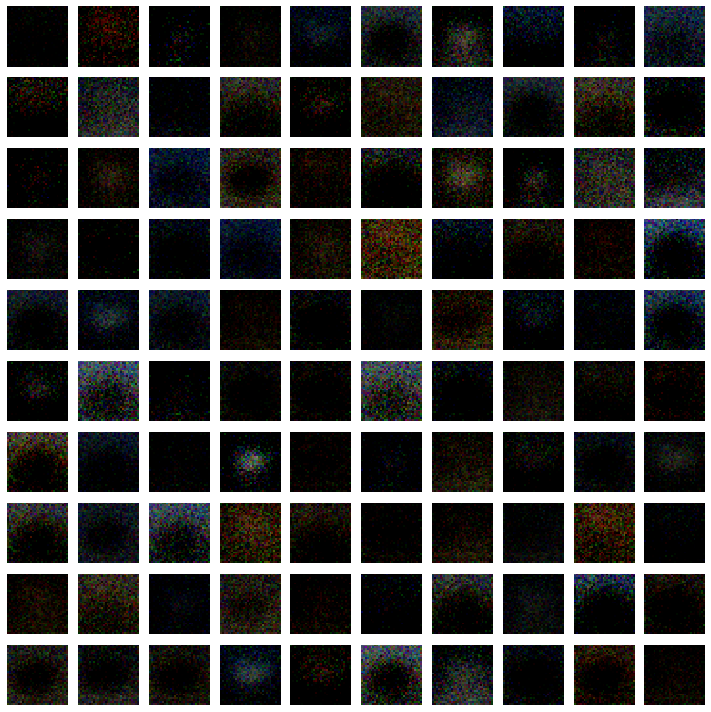

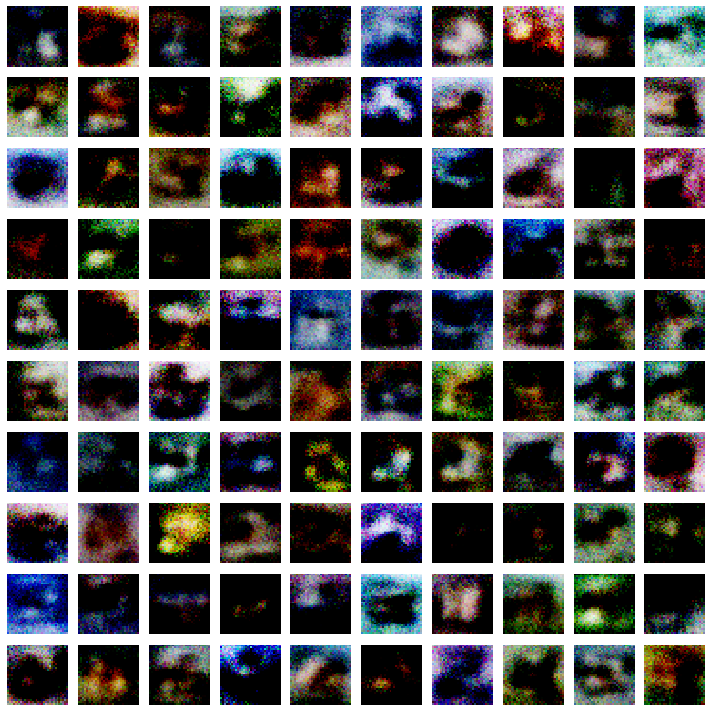

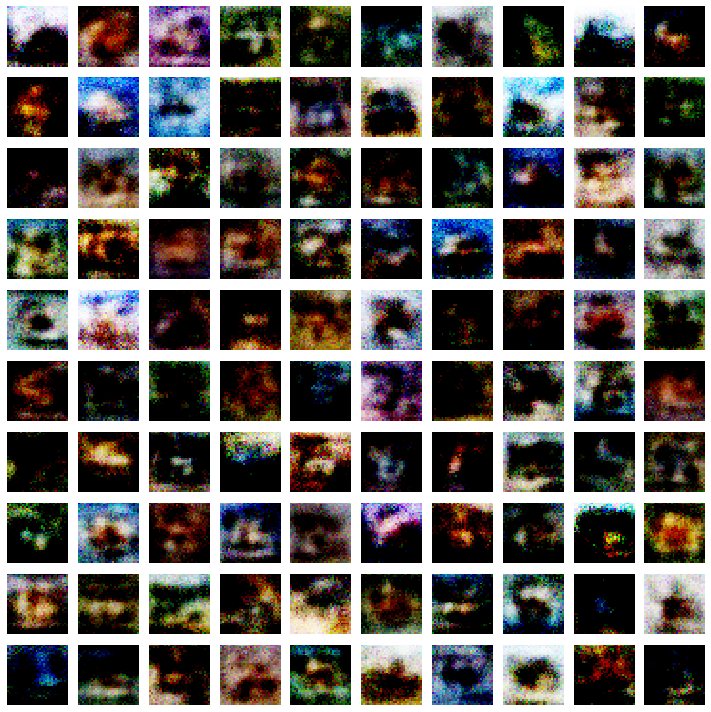

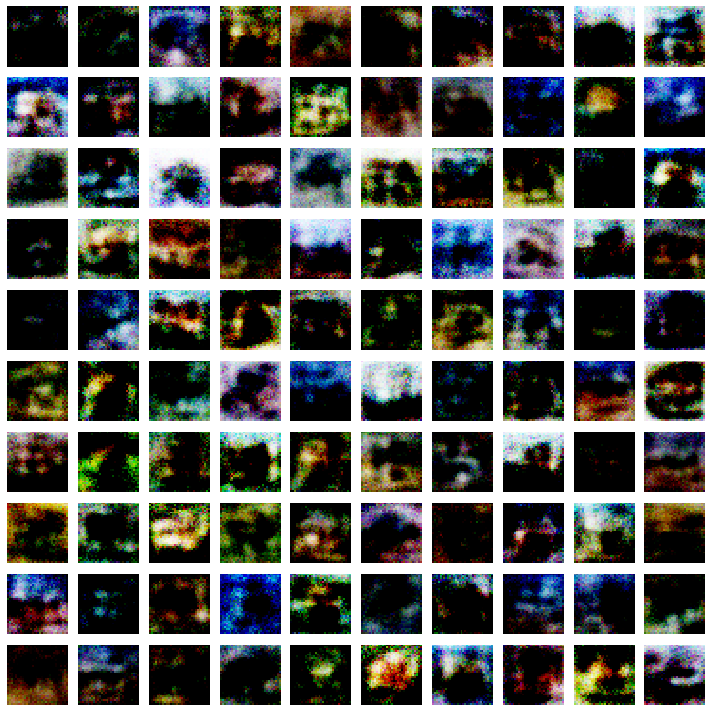

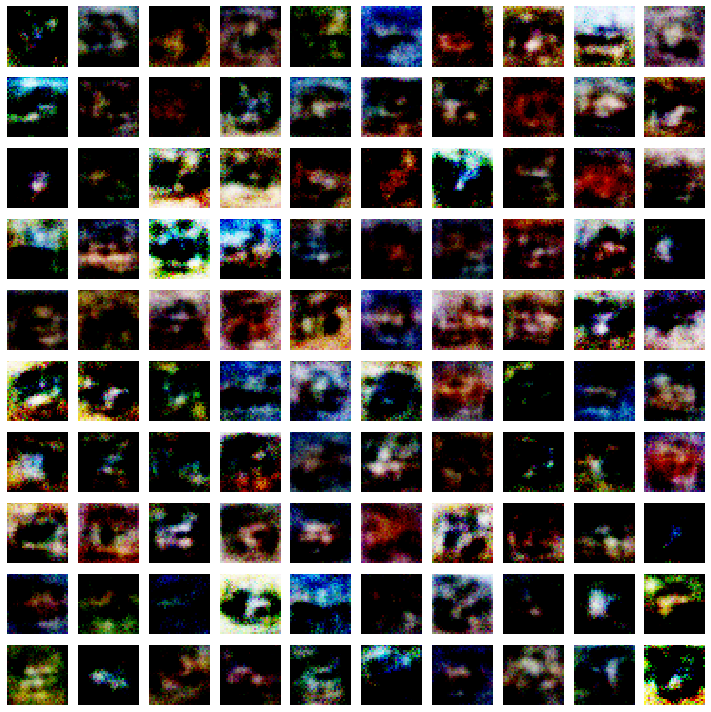

...

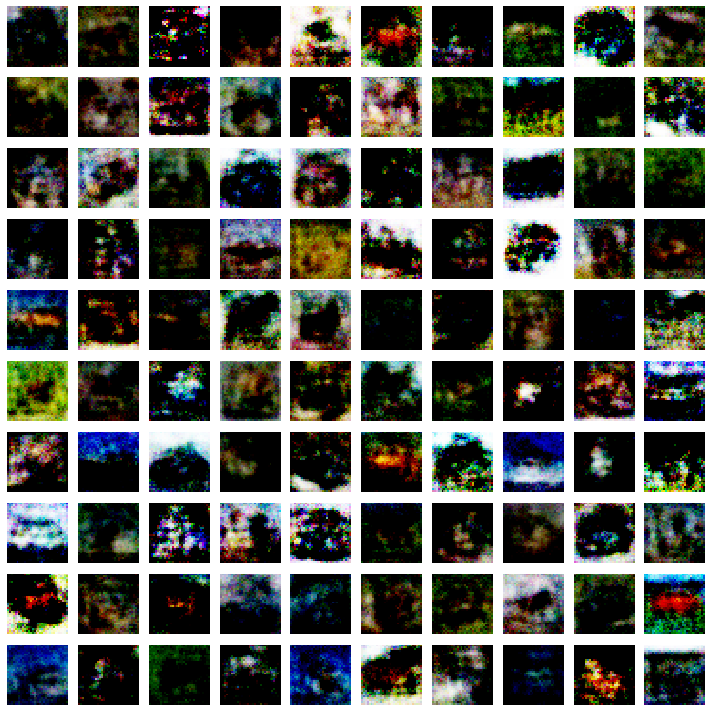

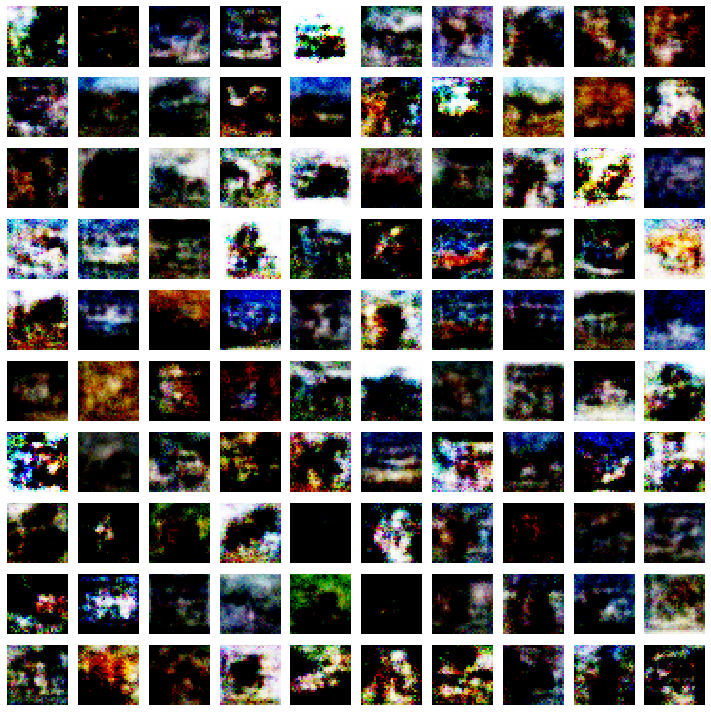

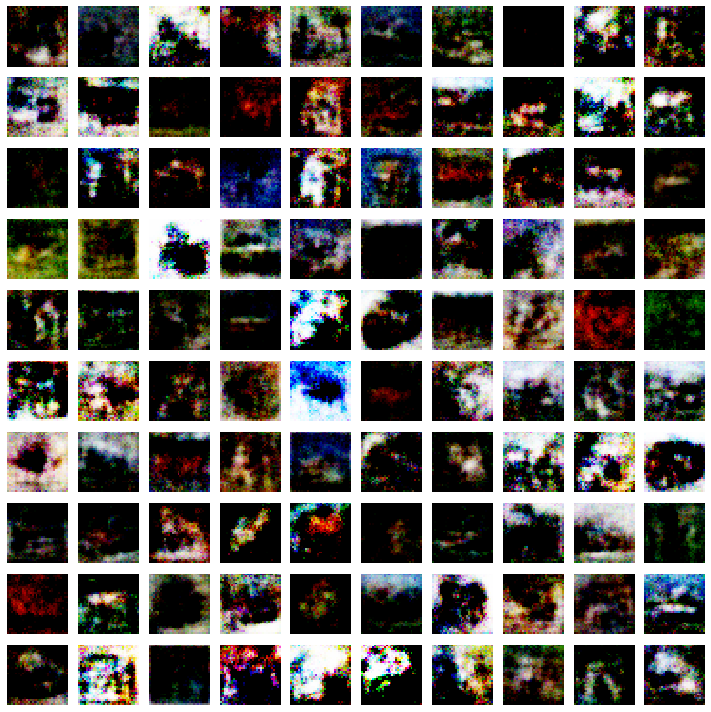

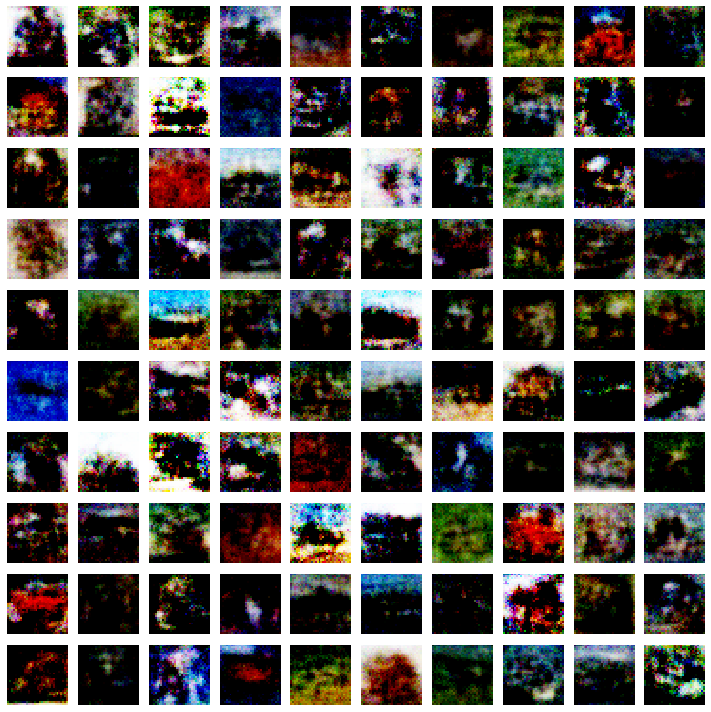

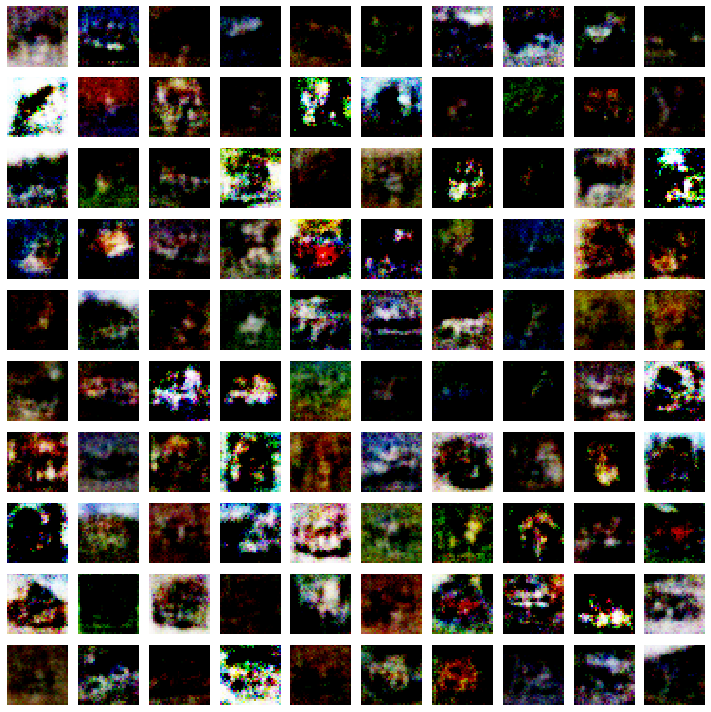

In [17]:
"""Starting the GAN training"""

def training(epochs=1, batch_size=128):
    
    #Loading the data
    (X_train, y_train, X_test, y_test) = load_data()
    #batch_count = X_train.shape[0] / batch_size
    
    # Creating GAN
    generator= create_generator()
    discriminator= create_discriminator()
    gan = create_gan(generator,discriminator)
    
    for e in range(1,epochs+1 ):
        print("Epoch %d" %e)
        for _ in tqdm(range(batch_size)):
        #generate  random noise as an input  to  initialize the  generator
            noise= np.random.normal(0,1, [batch_size, 100])
            
            # Generate fake Cifar10 images from noised input
            generated_images = generator.predict(noise)
            
            # Get a random set of  real images
            image_batch =X_train[np.random.randint(low=0,high=X_train.shape[0],size=batch_size)]
            
            # Construct different batches of real and fake data 
            X= np.concatenate([image_batch, generated_images])
            
            # Labels for generated and real data
            y_dis=np.zeros(2*batch_size)
            y_dis[:batch_size]=0.9
            
            #Pre train discriminator on  fake and real data  before starting the gan. 
            discriminator.trainable=True
            discriminator.train_on_batch(X, y_dis)
            
            #Tricking the noised input of the Generator as real data
            #noise= np.random.normal(0,1, [batch_size, 100])
            y_gen = np.ones(batch_size)
            
            # During the training of gan, 
            # the weights of discriminator should be fixed. 
            #We can enforce that by setting the trainable flag
            discriminator.trainable=False
            
            #training  the GAN by alternating the training of the Discriminator 
            #and training the chained GAN model with Discriminator’s weights freezed.
            gan.train_on_batch(noise, y_gen)
            
        if e == 1 or e % 20 == 0:
           
            plot_generated_images(e, generator)

    return generator
genrtr = training(epochs,batch_size)

**Using Generator to create artificial samples**

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

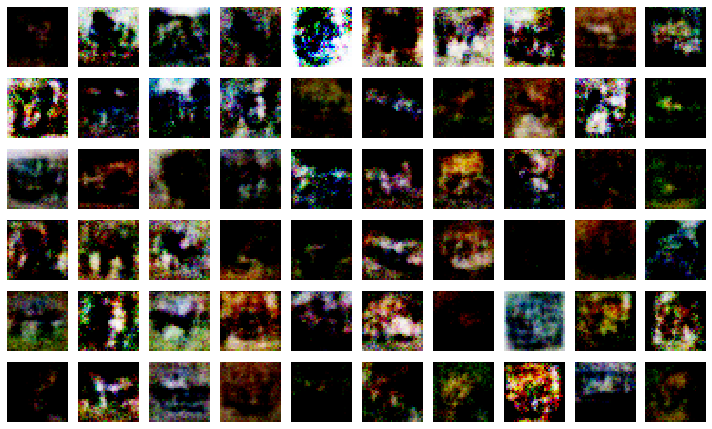

In [18]:

def generate_example(generator, examples=100, dim=(10,10), figsize=(10,10)):
    noise= np.random.normal(loc=0, scale=1, size=[examples, 100])
    generated_images = generator.predict(noise)
    generated_images = generated_images.reshape(examples,32,32,3)
    plt.figure(figsize=figsize)
    for i in range(generated_images.shape[0]):
        plt.subplot(dim[0], dim[1], i+1)
        plt.imshow(generated_images[i], interpolation='none')
        plt.axis('off')
    plt.tight_layout()
    
generate_example(genrtr,60)

**Creating the GIF from the generated images**

In [19]:
"""Creating a GIF out of the saved images"""

import imageio
import glob

anim_file = 'gan_cifar.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('gan*.png')
  filenames = sorted(filenames)
  last = -1
  for i,filename in enumerate(filenames):
    frame = 2*(i**0.5)
    if round(frame) > round(last):
      last = frame
    else:
      continue
    image = imageio.imread(filename)
    writer.append_data(image)
  image = imageio.imread(filename)
  writer.append_data(image)


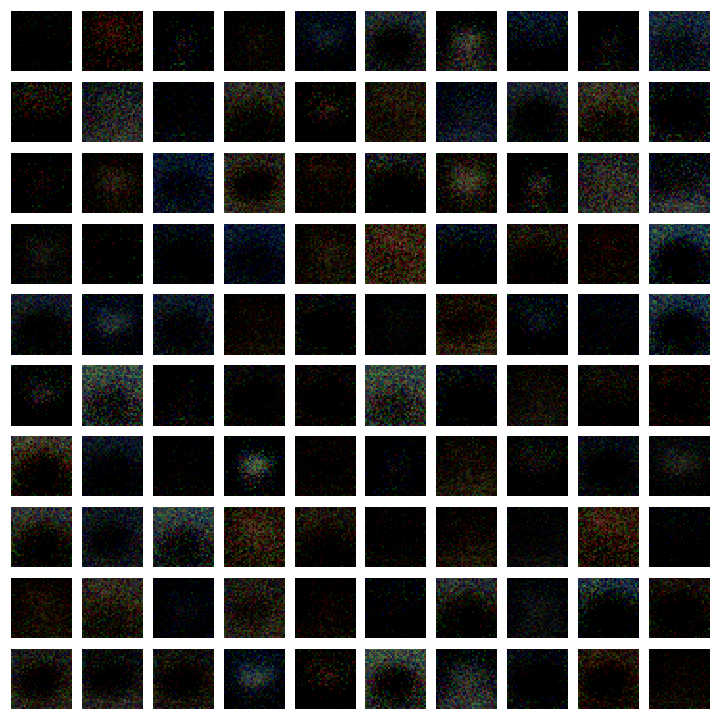

In [20]:
"""Viewing the GIF here"""

import IPython
from IPython.display import Image
Image(anim_file, format='png')

In [21]:
"""copying the generated images to the drive"""

import os

os.chdir('/content/drive/My Drive/')
os.mkdir('GAN_Cifar')
os.chdir('GAN_Cifar')
os.mkdir('Generated_imgs')
os.chdir(os.getcwd()+'/Generated_imgs')

In [30]:
!ls '/content/drive/My Drive/GAN_Cifar/Generated_imgs'

 gan_cifar.gif		       'gan_generated_image 260.png'
'gan_generated_image 100.png'  'gan_generated_image 280.png'
'gan_generated_image 120.png'  'gan_generated_image 300.png'
'gan_generated_image 140.png'  'gan_generated_image 320.png'
'gan_generated_image 160.png'  'gan_generated_image 340.png'
'gan_generated_image 180.png'  'gan_generated_image 360.png'
'gan_generated_image 1.png'    'gan_generated_image 380.png'
'gan_generated_image 200.png'  'gan_generated_image 400.png'
'gan_generated_image 20.png'   'gan_generated_image 40.png'
'gan_generated_image 220.png'  'gan_generated_image 60.png'
'gan_generated_image 240.png'  'gan_generated_image 80.png'


In [29]:
os.chdir('/content')
!cp *.gif '/content/drive/My Drive/GAN_Cifar/Generated_imgs/'